Cell 1 — Imports

In [1]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    roc_auc_score, average_precision_score,
    precision_score, recall_score, f1_score
)

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

import matplotlib.pyplot as plt


/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


Cell 2 — Load dataset

In [2]:
df = pd.read_csv("../data/lung_15_variable_cleaned.csv")

TARGET = "lung_cancer"
y = df[TARGET].astype(int)
X = df.drop(columns=[TARGET])

print("Dataset:", X.shape, "| Positives:", int(y.sum()), "| Pos rate:", float(y.mean()))


Dataset: (154887, 26) | Positives: 3723 | Pos rate: 0.024036878498518273


Cell 3 — Freeze test set (fixed forever)

In [3]:
X_trainval, X_test, y_trainval, y_test = train_test_split(
    X, y, test_size=0.20, stratify=y, random_state=42
)

print("Train+Val:", X_trainval.shape, "| Test:", X_test.shape)
print("Test positives:", int(y_test.sum()), "| Test pos rate:", float(y_test.mean()))


Train+Val: (123909, 26) | Test: (30978, 26)
Test positives: 745 | Test pos rate: 0.02404932532765188


Cell 4 — Model builder (your Super-Stacking, seed-controlled)

In [4]:
def build_super_stacking(scale_pos_weight, class_weight_pos, seed):
    base_lr = LogisticRegression(
        max_iter=2000, class_weight="balanced", solver="lbfgs"
    )

    base_xgb = XGBClassifier(
        n_estimators=500,
        learning_rate=0.01,
        max_depth=4,
        min_child_weight=2,
        subsample=0.6,
        colsample_bytree=0.8,
        gamma=0.3,
        reg_lambda=0.5,
        reg_alpha=0,
        scale_pos_weight=scale_pos_weight,
        objective="binary:logistic",
        eval_metric="logloss",
        n_jobs=-1,
        random_state=seed
    )

    base_lgb = LGBMClassifier(
        n_estimators=700,
        learning_rate=0.02,
        num_leaves=31,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        min_child_samples=20,
        reg_lambda=1.0,
        reg_alpha=0.0,
        class_weight="balanced",
        random_state=seed,
        n_jobs=-1
    )

    base_rf = RandomForestClassifier(
        n_estimators=800,
        max_depth=None,
        min_samples_split=5,
        min_samples_leaf=2,
        class_weight="balanced_subsample",
        n_jobs=-1,
        random_state=seed
    )

    base_gb = GradientBoostingClassifier(
        n_estimators=500,
        learning_rate=0.02,
        max_depth=3,
        min_samples_split=20,
        subsample=0.8,
        random_state=seed
    )

    base_cat = CatBoostClassifier(
        iterations=400,
        learning_rate=0.03,
        depth=6,
        loss_function="Logloss",
        eval_metric="AUC",
        class_weights=[1.0, class_weight_pos],
        random_state=seed,
        task_type="CPU",
        verbose=False
    )

    meta_lr = LogisticRegression(
        max_iter=2000, class_weight="balanced", solver="lbfgs"
    )

    model = StackingClassifier(
        estimators=[
            ("lr", base_lr),
            ("xgb", base_xgb),
            ("lgb", base_lgb),
            ("rf", base_rf),
            ("gb", base_gb),
            ("cat", base_cat),
        ],
        final_estimator=meta_lr,
        stack_method="predict_proba",
        n_jobs=-1,
        passthrough=False
    )
    return model


Cell 5 — Threshold + metrics helpers

In [5]:
def choose_threshold_max_f1(y_val, val_prob, lo=0.01, hi=0.30, n=300):
    thresholds = np.linspace(lo, hi, n)
    best_thr = 0.5
    best_f1 = -1.0
    for thr in thresholds:
        preds = (val_prob >= thr).astype(int)
        f1 = f1_score(y_val, preds, zero_division=0)
        if f1 > best_f1:
            best_f1 = f1
            best_thr = thr
    return float(best_thr), float(best_f1)

def safe_metrics(y_true, prob, thr):
    y_pred = (prob >= thr).astype(int)
    return {
        "auc_roc": roc_auc_score(y_true, prob) if len(np.unique(y_true)) > 1 else np.nan,
        "auc_pr": average_precision_score(y_true, prob) if len(np.unique(y_true)) > 1 else np.nan,
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall": recall_score(y_true, y_pred, zero_division=0),
        "f1": f1_score(y_true, y_pred, zero_division=0),
    }


Cell 6 — Experiment settings

In [6]:
fractions = [1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1]
seeds = [1, 2, 3, 4, 5]

print("Fractions:", fractions)
print("Seeds:", seeds)


Fractions: [1.0, 0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1]
Seeds: [1, 2, 3, 4, 5]


Cell 7 — Run experiment (produces raw runs table)

In [7]:
results = []

for frac in fractions:
    for seed in seeds:

        # A) Subsample from Train+Val
        if frac >= 1.0:
            X_sub, y_sub = X_trainval, y_trainval
        else:
            X_sub, _, y_sub, _ = train_test_split(
                X_trainval, y_trainval,
                train_size=frac,
                stratify=y_trainval,
                random_state=seed
            )

        # B) Train/Val split inside the subsample
        X_train, X_val, y_train, y_val = train_test_split(
            X_sub, y_sub,
            test_size=0.20,
            stratify=y_sub,
            random_state=seed
        )

        pos = int(y_train.sum())
        neg = int(len(y_train) - pos)
        if pos == 0:
            print(f"[SKIP] frac={frac}, seed={seed} -> 0 positives in train")
            continue

        scale_pos_weight = neg / pos
        class_weight_pos = neg / pos

        model = build_super_stacking(scale_pos_weight, class_weight_pos, seed)

        print(f"Training | frac={frac:.1f} seed={seed} | train={len(y_train)} val={len(y_val)} pos_train={pos}")
        model.fit(X_train, y_train)

        val_prob = model.predict_proba(X_val)[:, 1]
        test_prob = model.predict_proba(X_test)[:, 1]

        best_thr, best_val_f1 = choose_threshold_max_f1(y_val, val_prob, lo=0.01, hi=0.30, n=300)

        val_m = safe_metrics(y_val, val_prob, best_thr)
        test_m = safe_metrics(y_test, test_prob, best_thr)

        results.append({
            "fraction": frac,
            "seed": seed,
            "train_rows": int(X_train.shape[0]),
            "val_rows": int(X_val.shape[0]),
            "train_pos": int(y_train.sum()),
            "val_pos": int(y_val.sum()),
            "test_pos": int(y_test.sum()),
            "best_thr": best_thr,
            "val_best_f1": best_val_f1,

            "test_auc_roc": float(test_m["auc_roc"]),
            "test_auc_pr": float(test_m["auc_pr"]),
            "test_precision": float(test_m["precision"]),
            "test_recall": float(test_m["recall"]),
            "test_f1": float(test_m["f1"]),
        })

raw_df = pd.DataFrame(results)
raw_df.to_csv("data_fraction_raw_runs.csv", index=False)
print("Saved: data_fraction_raw_runs.csv")
raw_df.head()


Training | frac=1.0 seed=1 | train=99127 val=24782 pos_train=2382


/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 2382, number of negative: 96745
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 655
[LightGBM] [Info] Number of data points in the train set: 99127, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1906, number of negative: 77396
[LightGBM] [Info] Number of positive: 1905, number of negative: 77396
[LightGBM] [Info] Number of positive: 1905, number of negative: 77396
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003271 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 650
[LightGBM] [Info] Number of data points in the train set: 79301, number of used features: 26
[LightGBM] [Info] Number of positive: 1906, number of negative: 77396
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM]

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 2382, number of negative: 96745
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 654
[LightGBM] [Info] Number of data points in the train set: 99127, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 2382, number of negative: 96745
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 654
[LightGBM] [Info] Number of data points in the train set: 99127, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 2382, number of negative: 96745
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 654
[LightGBM] [Info] Number of data points in the train set: 99127, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 2382, number of negative: 96745
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 654
[LightGBM] [Info] Number of data points in the train set: 99127, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 2144, number of negative: 87070
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004530 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652
[LightGBM] [Info] Number of data points in the train set: 89214, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1715, number of negative: 69656
[LightGBM] [Info] Number of positive: 1715, number of negative: 69656
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in the train set: 71371, number of used features: 26
[LightGBM] [Info] Number of positive: 1716, number of negative: 69656
[LightGBM] [Info] Number of positive: 1715, number of negative: 69656
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 648
[LightGBM] [Info] Number of data points

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 2144, number of negative: 87070
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 652
[LightGBM] [Info] Number of data points in the train set: 89214, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 2144, number of negative: 87070
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004833 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 649
[LightGBM] [Info] Number of data points in the train set: 89214, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1716, number of negative: 69656
[LightGBM] [Info] Number of positive: 1715, number of negative: 69656
[LightGBM] [Info] Number of positive: 1715, number of negative: 69656
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002348 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647
[LightGBM] [Info] Number of data points in the train set: 71372, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 647
[LightGBM] [Info] Number of data points in the train set: 71371, number of used features: 26
[LightGBM] [Info] 

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1715, number of negative: 69656
[LightGBM] [Info] Number of positive: 1715, number of negative: 69656
[LightGBM] [Info] Number of positive: 1715, number of negative: 69656
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 647
[LightGBM] [Info] Number of data points in the train set: 71371, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 646
[LightGBM] [Info] Number of data points in th

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1524, number of negative: 61916
[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 645
[LightGBM] [Info] Number of data points in the train set: 63440, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 644
[LightGBM] [Info] Number of data points i

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1906, number of negative: 77395
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 648
[LightGBM] [Info] Number of data points in the train set: 79301, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007310 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of positive: 1524, number of negative: 61916
[LightGBM] [Info] Number of data points in the train set: 63441, number of used features: 26
[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 643
[LightGBM] [Info] Number of data points in the train set: 63441, number of used features: 26
[LightGBM] [Info

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1906, number of negative: 77395
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 648
[LightGBM] [Info] Number of data points in the train set: 79301, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1524, number of negative: 61916
[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Number of positive: 1525, number of negative: 61916
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008489 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 63440, number of used features: 26
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1334, number of negative: 54176
[LightGBM] [Info] Number of positive: 1334, number of negative: 54176
[LightGBM] [Info] Number of positive: 1335, number of negative: 54176
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005301 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004397 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Number of data points in the train set: 55510, number of used features: 26
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 55510, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightG

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1334, number of negative: 54176
[LightGBM] [Info] Number of positive: 1334, number of negative: 54176
[LightGBM] [Info] Number of positive: 1334, number of negative: 54176
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 55510, number of used features: 26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004003 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 642
[LightGBM] [Info] Number of data points in the train set: 55510, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] 

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1668, number of negative: 67720
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 644
[LightGBM] [Info] Number of data points in the train set: 69388, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1334, number of negative: 54176
[LightGBM] [Info] Number of positive: 1335, number of negative: 54176
[LightGBM] [Info] Number of positive: 1334, number of negative: 54176
[LightGBM] [Info] Number of positive: 1334, number of negative: 54176
[LightGBM] [Info] Number of positive: 1335, number of negative: 54176
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010367 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 55510, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Lig

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1430, number of negative: 58046
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 59476, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1144, number of negative: 46437
[LightGBM] [Info] Number of positive: 1144, number of negative: 46437
[LightGBM] [Info] Number of positive: 1144, number of negative: 46437
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 47581, number of used features: 26
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 636
[LightGBM] [Info] Number of data points in the train set: 47581, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1430, number of negative: 58046
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 59476, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1144, number of negative: 46437
[LightGBM] [Info] Number of positive: 1144, number of negative: 46437
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Number of data points in the train set: 47581, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Number of positive: 1144, number of negative: 46437
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in th

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1430, number of negative: 58046
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 641
[LightGBM] [Info] Number of data points in the train set: 59476, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1191, number of negative: 48372
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 49563, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 953, number of negative: 38697
[LightGBM] [Info] Number of positive: 953, number of negative: 38698
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 631
[LightGBM] [Info] Number of data points in the train set: 39650, number of used features: 26
[LightGBM] [Info] Number of positive: 953, number of negative: 38698
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 633
[LightGBM] [Info] Number of data points in the train set: 39651, number of used features: 26
[LightGBM] [Info] Number of positive: 953, number of negative: 38697
[LightGBM] [Info] [b

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 953, number of negative: 38698
[LightGBM] [Info] Number of positive: 953, number of negative: 38697
[LightGBM] [Info] Number of positive: 953, number of negative: 38697
[LightGBM] [Info] Number of positive: 952, number of negative: 38698
[LightGBM] [Info] Number of positive: 953, number of negative: 38698
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 633
[LightGBM] [Info] Number of data points in the train set: 39651, number of used features: 26
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 632
[LightGBM] [Info] Number of data points in t

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 1191, number of negative: 48372
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 640
[LightGBM] [Info] Number of data points in the train set: 49563, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 953, number of negative: 38697
[LightGBM] [Info] Number of positive: 953, number of negative: 38697
[LightGBM] [Info] Number of positive: 953, number of negative: 38698
[LightGBM] [Info] Number of positive: 952, number of negative: 38698
[LightGBM] [Info] Number of positive: 953, number of negative: 38698
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Number of data points in the train set: 39650, number of used features: 26
[LightGBM] [Info] Total Bins 634
[LightGBM] [Info] Number of data points in the train set: 39650, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 953, number of negative: 38697
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 633
[LightGBM] [Info] Number of data points in the train set: 39650, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 571, number of negative: 23219
[LightGBM] [Info] Number of positive: 571, number of negative: 23218
[LightGBM] [Info] Number of positive: 571, number of negative: 23219
[LightGBM] [Info] Number of positive: 571, number of negative: 23218
[LightGBM] [Info] Number of positive: 572, number of negative: 23218
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001576 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622
[LightGBM] [Info] Number of data points in the train set: 23789, number of used features: 26
[LightGBM] [Info] Total Bins 621
[LightGBM] [Info] Number of data points in t

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 571, number of negative: 23219
[LightGBM] [Info] Number of positive: 571, number of negative: 23218
[LightGBM] [Info] Number of positive: 571, number of negative: 23218
[LightGBM] [Info] Number of positive: 572, number of negative: 23218
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001962 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622
[LightGBM] [Info] Number of data points in the train set: 23790, number of used features: 26
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 621
[LightGBM] [Info] Number of data points in the train set: 23789, number of used features: 26
[LightGBM] [Info] Au

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 571, number of negative: 23219
[LightGBM] [Info] Number of positive: 572, number of negative: 23218
[LightGBM] [Info] Number of positive: 571, number of negative: 23218
[LightGBM] [Info] Number of positive: 571, number of negative: 23218
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003486 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 619
[LightGBM] [Info] Number of data points in the train set: 23790, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [In

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 477, number of negative: 19347
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 622
[LightGBM] [Info] Number of data points in the train set: 19824, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 381, number of negative: 15478
[LightGBM] [Info] Number of positive: 382, number of negative: 15477
[LightGBM] [Info] Number of positive: 382, number of negative: 15478
[LightGBM] [Info] Number of positive: 381, number of negative: 15478
[LightGBM] [Info] Number of positive: 382, number of negative: 15477
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002588 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 15859, number of used features: 26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of d

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 238, number of negative: 9674
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 609
[LightGBM] [Info] Number of data points in the train set: 9912, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/Users/vrajpatel/miniforge3/envs/8th/lib/python3.9/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Number of positive: 238, number of negative: 9674
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 606
[LightGBM] [Info] Number of data points in the train set: 9912, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

,fraction,seed,train_rows,val_rows,train_pos,val_pos,test_pos,best_thr,val_best_f1,test_auc_roc,test_auc_pr,test_precision,test_recall,test_f1
0,1.0,1,99127,24782,2382,596,745,0.3,0.101592,0.836023,0.116594,0.054780,0.873826,0.103096
1,1.0,2,99127,24782,2382,596,745,0.3,0.102509,0.836086,0.118443,0.054976,0.876510,0.103462
2,1.0,3,99127,24782,2382,596,745,0.3,0.101672,0.836612,0.117537,0.054007,0.873826,0.101727
3,1.0,4,99127,24782,2382,596,745,0.3,0.102817,0.836022,0.117791,0.054809,0.876510,0.103168
4,1.0,5,99127,24782,2382,596,745,0.3,0.100453,0.835359,0.116912,0.053711,0.879195,0.101236


Cell 8 — Create the summary table (mean ± std for ALL metrics)

In [8]:
summary = (
    raw_df
    .groupby("fraction")
    .agg(
        runs=("seed", "count"),

        auc_roc_mean=("test_auc_roc", "mean"),
        auc_roc_std=("test_auc_roc", "std"),

        auc_pr_mean=("test_auc_pr", "mean"),
        auc_pr_std=("test_auc_pr", "std"),

        recall_mean=("test_recall", "mean"),
        recall_std=("test_recall", "std"),

        precision_mean=("test_precision", "mean"),
        precision_std=("test_precision", "std"),

        f1_mean=("test_f1", "mean"),
        f1_std=("test_f1", "std"),
    )
    .reset_index()
    .sort_values("fraction", ascending=False)
)

summary.to_csv("data_fraction_summary.csv", index=False)
print("Saved: data_fraction_summary.csv")
summary


Saved: data_fraction_summary.csv


,fraction,runs,auc_roc_mean,auc_roc_std,auc_pr_mean,auc_pr_std,recall_mean,recall_std,precision_mean,precision_std,f1_mean,f1_std
9,1.0,5,0.836021,0.000445,0.117455,0.000730,0.875973,0.002246,0.054456,0.000561,0.102538,0.000989
8,0.9,5,0.836128,0.000400,0.118186,0.000761,0.875705,0.003627,0.054750,0.000504,0.103057,0.000872
7,0.8,5,0.835901,0.001201,0.118882,0.001475,0.874899,0.002401,0.054309,0.000749,0.102268,0.001337
6,0.7,5,0.835738,0.000647,0.115458,0.002584,0.875973,0.002783,0.054441,0.000402,0.102511,0.000716
5,0.6,5,0.835685,0.000699,0.116212,0.002951,0.876779,0.002401,0.054661,0.000497,0.102906,0.000866
4,0.5,5,0.835376,0.001740,0.115665,0.002037,0.876510,0.004137,0.054695,0.000977,0.102963,0.001724
3,0.4,5,0.835607,0.000803,0.116147,0.002700,0.881074,0.004895,0.053606,0.001058,0.101060,0.001859
2,0.3,5,0.833690,0.001592,0.110337,0.003926,0.880805,0.003474,0.053094,0.000746,0.100150,0.001309
1,0.2,5,0.833135,0.001017,0.109044,0.003277,0.875705,0.010336,0.054032,0.001675,0.101776,0.002906
0,0.1,5,0.831075,0.003464,0.108458,0.005250,0.880805,0.009173,0.052022,0.002786,0.098225,0.004933


Cell 9 — Make a clean “report table” (mean ± std combined into one column per metric)

In [10]:
report_table = summary.copy()

def mean_std_str(mean, std):
    if pd.isna(std):
        return f"{mean:.4f}"
    return f"{mean:.4f} ± {std:.4f}"

report_table["AUC-ROC"] = report_table.apply(lambda r: mean_std_str(r["auc_roc_mean"], r["auc_roc_std"]), axis=1)
report_table["AUC-PR"]  = report_table.apply(lambda r: mean_std_str(r["auc_pr_mean"], r["auc_pr_std"]), axis=1)
report_table["Recall"]  = report_table.apply(lambda r: mean_std_str(r["recall_mean"], r["recall_std"]), axis=1)
report_table["Precision"] = report_table.apply(lambda r: mean_std_str(r["precision_mean"], r["precision_std"]), axis=1)
report_table["F1"]      = report_table.apply(lambda r: mean_std_str(r["f1_mean"], r["f1_std"]), axis=1)

final_table = report_table[["fraction", "runs", "AUC-ROC", "AUC-PR", "Recall", "Precision", "F1"]].copy()
final_table.rename(columns={"fraction": "Training Fraction"}, inplace=True)

final_table.to_csv("data_fraction_report_table.csv", index=False)
print("Saved: data_fraction_report_table.csv")
final_table


Saved: data_fraction_report_table.csv


,Training Fraction,runs,AUC-ROC,AUC-PR,Recall,Precision,F1
9,1.0,5,0.8360 ± 0.0004,0.1175 ± 0.0007,0.8760 ± 0.0022,0.0545 ± 0.0006,0.1025 ± 0.0010
8,0.9,5,0.8361 ± 0.0004,0.1182 ± 0.0008,0.8757 ± 0.0036,0.0548 ± 0.0005,0.1031 ± 0.0009
7,0.8,5,0.8359 ± 0.0012,0.1189 ± 0.0015,0.8749 ± 0.0024,0.0543 ± 0.0007,0.1023 ± 0.0013
6,0.7,5,0.8357 ± 0.0006,0.1155 ± 0.0026,0.8760 ± 0.0028,0.0544 ± 0.0004,0.1025 ± 0.0007
5,0.6,5,0.8357 ± 0.0007,0.1162 ± 0.0030,0.8768 ± 0.0024,0.0547 ± 0.0005,0.1029 ± 0.0009
4,0.5,5,0.8354 ± 0.0017,0.1157 ± 0.0020,0.8765 ± 0.0041,0.0547 ± 0.0010,0.1030 ± 0.0017
3,0.4,5,0.8356 ± 0.0008,0.1161 ± 0.0027,0.8811 ± 0.0049,0.0536 ± 0.0011,0.1011 ± 0.0019
2,0.3,5,0.8337 ± 0.0016,0.1103 ± 0.0039,0.8808 ± 0.0035,0.0531 ± 0.0007,0.1001 ± 0.0013
1,0.2,5,0.8331 ± 0.0010,0.1090 ± 0.0033,0.8757 ± 0.0103,0.0540 ± 0.0017,0.1018 ± 0.0029
0,0.1,5,0.8311 ± 0.0035,0.1085 ± 0.0053,0.8808 ± 0.0092,0.0520 ± 0.0028,0.0982 ± 0.0049


Cell 12 — Optional: Plot thresholds vs fraction (nice “extra”)

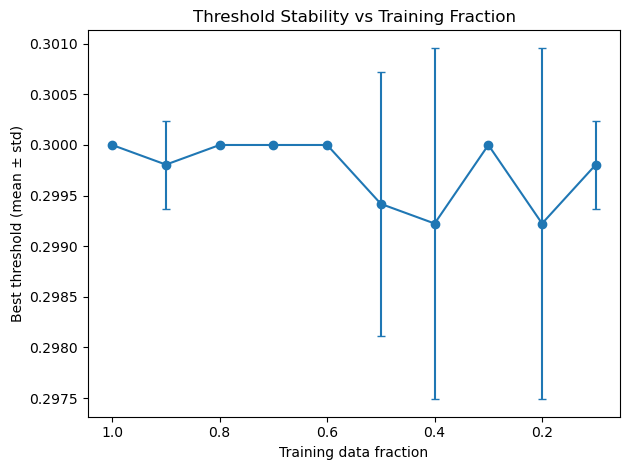

Saved: threshold_stability.png


In [13]:
thr_summary = raw_df.groupby("fraction").agg(
    thr_mean=("best_thr", "mean"),
    thr_std=("best_thr", "std")
).reset_index().sort_values("fraction", ascending=False)

plt.figure()
plt.errorbar(thr_summary["fraction"], thr_summary["thr_mean"], yerr=thr_summary["thr_std"],
             marker="o", capsize=3)
plt.gca().invert_xaxis()
plt.xlabel("Training data fraction")
plt.ylabel("Best threshold (mean ± std)")
plt.title("Threshold Stability vs Training Fraction")
plt.tight_layout()
plt.savefig("threshold_stability.png", dpi=200)
plt.show()

print("Saved: threshold_stability.png")


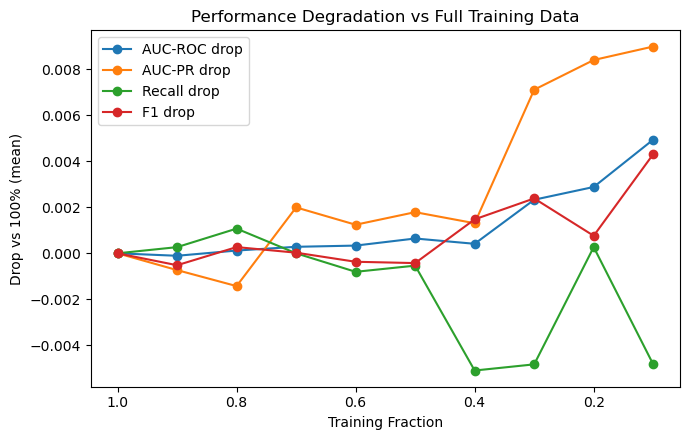

In [16]:
base = summary.loc[summary["fraction"] == 1.0].iloc[0]

delta = summary.copy()
delta["aucroc_drop"] = base["auc_roc_mean"] - delta["auc_roc_mean"]
delta["aucpr_drop"]  = base["auc_pr_mean"] - delta["auc_pr_mean"]
delta["recall_drop"] = base["recall_mean"] - delta["recall_mean"]
delta["f1_drop"]     = base["f1_mean"] - delta["f1_mean"]

plt.figure(figsize=(7,4.5))
plt.plot(delta["fraction"], delta["aucroc_drop"], marker="o", label="AUC-ROC drop")
plt.plot(delta["fraction"], delta["aucpr_drop"], marker="o", label="AUC-PR drop")
plt.plot(delta["fraction"], delta["recall_drop"], marker="o", label="Recall drop")
plt.plot(delta["fraction"], delta["f1_drop"], marker="o", label="F1 drop")
plt.gca().invert_xaxis()
plt.xlabel("Training Fraction")
plt.ylabel("Drop vs 100% (mean)")
plt.title("Performance Degradation vs Full Training Data")
plt.legend()
plt.tight_layout()
plt.savefig("gh_drop_vs_full.png", dpi=250)
plt.show()


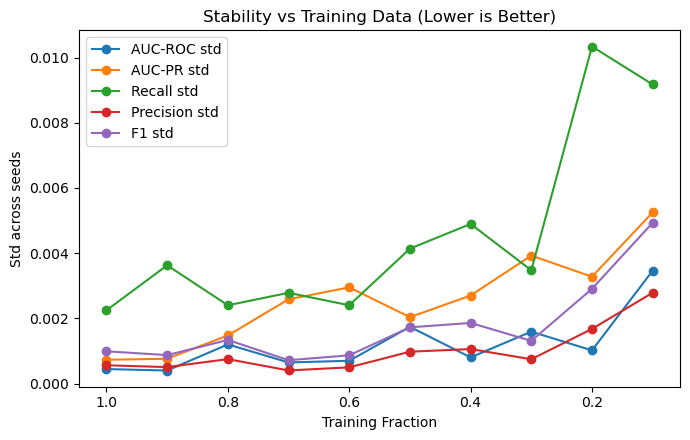

In [17]:
plt.figure(figsize=(7,4.5))
plt.plot(summary["fraction"], summary["auc_roc_std"], marker="o", label="AUC-ROC std")
plt.plot(summary["fraction"], summary["auc_pr_std"], marker="o", label="AUC-PR std")
plt.plot(summary["fraction"], summary["recall_std"], marker="o", label="Recall std")
plt.plot(summary["fraction"], summary["precision_std"], marker="o", label="Precision std")
plt.plot(summary["fraction"], summary["f1_std"], marker="o", label="F1 std")
plt.gca().invert_xaxis()
plt.xlabel("Training Fraction")
plt.ylabel("Std across seeds")
plt.title("Stability vs Training Data (Lower is Better)")
plt.legend()
plt.tight_layout()
plt.savefig("gh_stability_std.png", dpi=250)
plt.show()


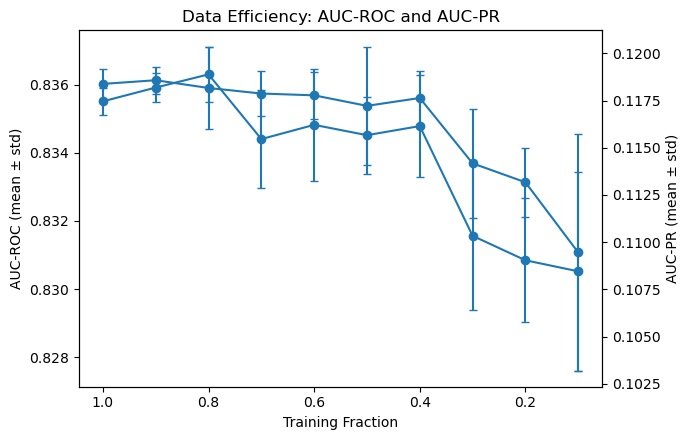

In [18]:
fig, ax1 = plt.subplots(figsize=(7,4.5))

ax1.errorbar(x, summary["auc_roc_mean"], yerr=summary["auc_roc_std"], marker="o", capsize=3)
ax1.set_xlabel("Training Fraction")
ax1.set_ylabel("AUC-ROC (mean ± std)")
ax1.invert_xaxis()

ax2 = ax1.twinx()
ax2.errorbar(x, summary["auc_pr_mean"], yerr=summary["auc_pr_std"], marker="o", capsize=3)
ax2.set_ylabel("AUC-PR (mean ± std)")

plt.title("Data Efficiency: AUC-ROC and AUC-PR")
plt.tight_layout()
plt.savefig("gh_dual_aucroc_aucpr.png", dpi=250)
plt.show()
